#vHMML GIS Manuscript Viewer

- [vHMML](https://www.vhmml.org/) (Virtual Hill Museum & Manuscript Library)
  - Headquarters are the Hill Museum & Manuscript Library at Saint John's University, Collegeville, MN
  - Dedicated to cataloguing manuscripts housed in Europe, Africa, the Middle East, and South Asia
  - Specialize in eastern Christian, medieval Islamic, and Buddhist and Hindu studies
- Prerequisites 
  - Python, especially data structures (lists, dictionary, tuples, etc.)
  - Pandas library
  - Jupyter Notebook/Colab

- Goals:
  - To scrape and clean data from vHMML in Jupyter Notebook 
  - To view the present location of nearly 100,000 manuscripts catalogued by the vHMML
  - To create queries with Pandas to specify which manuscripts to view 

###1. Initial Setup

Objectives:
- Import relevant libraries
- Install non-native libraries to Jupyter Notebook/Colab

In [1]:
#Standard library for data organization
import pandas as pd

#Libraries used to load the zipfile on vHMML website
import zipfile
import urllib.request
import json
import io

#Automates latitude and longitude retrieval
from geopy.geocoders import Nominatim

#GIS library with interactive map
import folium
from folium.plugins import FastMarkerCluster

#Clean string data
!pip install unidecode
import unidecode

     |████████████████████████████████| 235 kB 28.1 MB/s 


###2. Scrape Data from vHMML

Objectives:
- Find and retrieve data from vHMML's website 
  - [vHMML.org](https://vHMML.org) -> Data Portal -> Download 
  - urllib.request
- Unzip downloadable file
  - zipfile and io
- Normalize json object into a Pandas dataframe
  - json and pandas

In [2]:
#Copy link address
access_url = urllib.request.urlopen('https://www.vhmml.org/datasets/vhmml_rr_fulldata.zip')
z = zipfile.ZipFile(io.BytesIO(access_url.read()))
data = json.loads(z.read(z.infolist()[0]).decode())

View the json formatted data

In [3]:
data

[{'PURL': 'https://w3id.org/vhmml/readingRoom/view/2',
  'accessRestriction': 'On-site only or order a scan',
  'alternateSurrogates': [],
  'bibliography': 'Christine Glassner, Inventar der mittelalterlichen Handschriften des Benediktinerstiftes Seitenstetten, nach dem handschriftlichen Katalog (2005)',
  'captureDateDisplay': '',
  'city': {'authorityUriLC': 'https://id.loc.gov/authorities/names/n85824011',
   'authorityUriVIAF': 'https://viaf.org/viaf/140799906',
   'countryId': 69,
   'id': 1055,
   'name': 'Seitenstetten'},
  'collation': 'xiii + 327',
  'collection': '1064',
  'country': {'authorityUriLC': 'https://id.loc.gov/authorities/names/n79040121',
   'authorityUriVIAF': 'https://viaf.org/viaf/148842731',
   'id': 69,
   'name': 'Austria'},
  'currentStatus': 'In situ',
  'downloadOption': 'No',
  'extents': [{'count': 340,
    'displayName': 'leaf(ves)',
    'folioImported': '340 leaf(ves)',
    'id': 185520}],
  'externalBibliographyUrls': [],
  'externalFacsimileUrls': 

Normalize json data with Pandas

In [4]:
df = pd.json_normalize(data)

In [5]:
df.tail()

,id,PURL,rights,processedBy,shelfMark,collation,bibliography,notes,foliation,hmmlProjectNumber,objectType,accessRestriction,viewableOnline,downloadOption,externalFacsimileUrls,collection,captureDateDisplay,alternateSurrogates,externalBibliographyUrls,extents,genres,subjects,features,currentStatus,objectContributors,parts,country.id,country.name,country.authorityUriLC,country.authorityUriVIAF,city.id,city.name,city.authorityUriLC,city.authorityUriVIAF,city.countryId,repository.id,repository.name,repository.authorityUriLC,repository.authorityUriVIAF,repository.cityId,...,surrogateFormat.name,support,conditionNotes,reproductionNotes,featuresImported,provenance,acknowledgments,binding,bindingDimensionsImported,bindingWidth,bindingHeight,holdingInstitution.id,holdingInstitution.name,commonName,bindingDepth,archivalid,collectionFond,series,containerType,containerCount,title,scopeContent,historicalNote,custodialHistory,beginDate,endDate,centuries,centuryUncertain,languages,writingSystem,associatedNames,contents,datePreciseYear,centuryImported,subSeries,decoration,creator,datePreciseMonth,datePreciseDay,subSubSeries
92490,540074.0,https://w3id.org/vhmml/readingRoom/view/540074,https://www.vhmml.org/terms,HMML,NaN,NaN,NaN,NaN,NaN,HMML 00562,MANUSCRIPT,Unregistered or order a digital copy,True,NO,[],HMML,,[],[],[],[],[],[],In situ,[],[],66.0,United States,https://id.loc.gov/authorities/names/n78095330,https://viaf.org/viaf/130168302,934.0,Collegeville (Minn.),https://id.loc.gov/authorities/names/n50046539,https://viaf.org/viaf/150063915,66.0,266.0,Hill Museum & Manuscript Library. Special Coll...,https://id.loc.gov/authorities/names/no2005044796,https://viaf.org/viaf/130545939,934.0,...,Digital,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,"Saint John's University (Collegeville, Minn.)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92491,540075.0,https://w3id.org/vhmml/readingRoom/view/540075,https://www.vhmml.org/terms,HMML,NaN,NaN,NaN,NaN,NaN,HMML 00563,MANUSCRIPT,Unregistered or order a digital copy,True,NO,[],HMML,,[],[],[],[],[],[],In situ,[],[],66.0,United States,https://id.loc.gov/authorities/names/n78095330,https://viaf.org/viaf/130168302,934.0,Collegeville (Minn.),https://id.loc.gov/authorities/names/n50046539,https://viaf.org/viaf/150063915,66.0,266.0,Hill Museum & Manuscript Library. Special Coll...,https://id.loc.gov/authorities/names/no2005044796,https://viaf.org/viaf/130545939,934.0,...,Digital,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,"Saint John's University (Collegeville, Minn.)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92492,540076.0,https://w3id.org/vhmml/readingRoom/view/540076,https://www.vhmml.org/terms,HMML,Cod. A.F. 69a,NaN,"<p>Joseph von Hammer-Purgstall,&nbsp;<em>Codic...",<p>Death note dated 2 Jumād&aacute; al-Thānī 1...,Modern foliation and pagination in Arabic nume...,22195,MANUSCRIPT,On-site only or order a scan,True,NO,"[{'id': 5771, 'url': 'http://data.onb.ac.at/dt...",22195,,[],"[{'id': 91350, 'url': 'http://data.onb.ac.at/r...","[{'id': 299836, 'count': 388, 'displayName': '...","[{'id': 102, 'name': 'Historical works', 'uri'...",[],"[{'id': 31, 'name': 'Seal(s)'}]",In situ,[],"[{'id': 734193, 'type': 'Manuscript', 'partNum...",69.0,Austria,https://id.loc.gov/authorities/names/n79040121,https://viaf.org/viaf/148842731,914.0,Vienna,https://id.loc.gov/authorities/names/n79018895,https://viaf.org/viaf/155870729,69.0,220.0,Österreichische Nationalbibliothek,https://id.loc.gov/authorities/names/n79068404,https://viaf.org/viaf/136765452,914.0,...,Microform,Paper,NaN,NaN,NaN,"<p>Purchase note of حسين, fol. 388r; ownership...",Cataloged by Joshua Mugler,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92493,540077.0,https://w3id.org/vhmml/readingRoom/view/540077,https://www.vhmml.org/terms,HMML,Cod. A.F. 74,N

- View the data schema documentation at vHMML's website
  - Download -> Data Schema

###3.Clean Data

[vHMML Manuscript Schema](https://www.vhmml.org/dataPortal/schema)

Objectives:
- Drop all unnecessary information 
- Drop all columns without ids
- Find and create columns for:
  - Centuries
  - Languages
  - Coordinates

In [6]:
df.columns

Index(['id', 'PURL', 'rights', 'processedBy', 'shelfMark', 'collation',
       'bibliography', 'notes', 'foliation', 'hmmlProjectNumber', 'objectType',
       'accessRestriction', 'viewableOnline', 'downloadOption',
       'externalFacsimileUrls', 'collection', 'captureDateDisplay',
       'alternateSurrogates', 'externalBibliographyUrls', 'extents', 'genres',
       'subjects', 'features', 'currentStatus', 'objectContributors', 'parts',
       'country.id', 'country.name', 'country.authorityUriLC',
       'country.authorityUriVIAF', 'city.id', 'city.name',
       'city.authorityUriLC', 'city.authorityUriVIAF', 'city.countryId',
       'repository.id', 'repository.name', 'repository.authorityUriLC',
       'repository.authorityUriVIAF', 'repository.cityId',
       'surrogateFormat.id', 'surrogateFormat.name', 'support',
       'conditionNotes', 'reproductionNotes', 'featuresImported', 'provenance',
       'acknowledgments', 'binding', 'bindingDimensionsImported',
       'bindingWidth',

In [7]:
df = df.drop(columns=['rights', 'processedBy', 'notes', 'accessRestriction', 'collection', 'genres',
                      'collation', 'bibliography', 'objectType', 'currentStatus', 'country.id', 'city.id',
                      'city.countryId', 'repository.id','repository.cityId', 'surrogateFormat.id', 'surrogateFormat.name',
                      'subjects', 'features', 'objectContributors', 'country.authorityUriLC', 'country.authorityUriVIAF',
                      'city.authorityUriLC', 'city.authorityUriVIAF', 'repository.authorityUriLC', 
                      'repository.authorityUriVIAF', 'support', 'conditionNotes', 'reproductionNotes',
                      'featuresImported', 'provenance', 'acknowledgments', 'binding', 'hmmlProjectNumber',
                      'bindingDimensionsImported', 'bindingWidth', 'bindingHeight', 'holdingInstitution.id',
                      'holdingInstitution.name', 'commonName', 'bindingDepth', 'archivalid', 'shelfMark',
                      'collectionFond', 'series', 'containerType', 'containerCount', 'title',
                      'scopeContent', 'historicalNote', 'custodialHistory', 'beginDate', 'endDate',
                      'centuryUncertain', 'writingSystem', 'associatedNames','contents', 'datePreciseYear',
                      'centuryImported', 'subSeries', 'decoration', 'creator', 'datePreciseMonth', 'datePreciseDay',
                      'subSubSeries', 'viewableOnline', 'downloadOption', 'extents','foliation','externalFacsimileUrls',
                      'captureDateDisplay', 'alternateSurrogates', 'externalBibliographyUrls'])

In [8]:
len(df)

92495

In [9]:
#drop na in id
df = df.dropna(subset=['id'])

In [10]:
len(df)

92494

####A. Centuries

- Find centuries of manuscript under parts
- Write a function to skim all entries for centuries

In [11]:
#The actual centuries column does not contain any entries
df['centuries'].nunique

<bound method IndexOpsMixin.nunique of 0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
92489    NaN
92490    NaN
92491    NaN
92492    NaN
92493    NaN
Name: centuries, Length: 92494, dtype: object>

In [12]:
#Pull century value from parts


df.parts[5555][0].get('centuries')

[15, 16]

Function that creates a list of all centuries for each manuscript in a df
- Create a blank list that will append new information
- Create a for-loop which manuscript according to the len of the df
- Try-Except clauses since some of the entries are blank
- Return a list of centuries

In [13]:
def get_centuries(df):
  centuries = []
  for x in range(len(df)):
    try:
      y = df.parts[x][0].get('centuries')
      centuries.append(y)
    except:
      centuries.append(None)
  return centuries

In [14]:
#Create a new list called centuries using 


centuries = get_centuries(df)

In [15]:
centuries[:10]

[[15], [15], [14, 15], [15], [15], [15], [15], [15], [15], [15]]

In [16]:
#Verify function works
len(centuries) == len(df)

True

In [17]:
#Override the previous centuries column with the new list
df['centuries'] = centuries

In [18]:
#Turn the lists within centuries into strings for easier querying later
df['centuries'] = df['centuries'].astype(str).apply(lambda x: x.replace('[','').replace(']',''))

In [19]:
df['centuries'].unique()

array(['15', '14, 15', '14', '16', '17, 16, 15', '15, 16', '12, 13',
       '16, 15, 14, 13, 12, 11, 10, 9', '13', '12', '17', '11', '13, 12',
       '11, 12, 13', '14, 13, 12', '15, 14', '11, 12', '6', '9', '',
       '16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6', '17, 16, 15, 14, 13',
       '16, 15, 14', '20', '15, 16, 17', '16, 17', '18, 19', '13, 14',
       '14, 13', '16, 15', '18', '19', '12, 13, 14', '13, 14, 15',
       '15, 14, 13, 12', '14, 13, 12, 11', '10', '13, 12, 11', '10, 11',
       '17, 18', '8, 9, 10', '8', '12, 11', '9, 10', '10, 9', '8, 7',
       '8, 9', '18, 17', '17, 16', '16, 15, 14, 13, 12, 11',
       '15, 14, 13, 12, 11, 10, 9', '15, 14, 13',
       '18, 17, 16, 15, 14, 13, 12', '18, 17, 16, 15, 14',
       '16, 15, 14, 13', '5', '15, 14, 13, 12, 11', '16, 17, 18',
       '14, 15, 16, 17, 18', '11, 12, 13, 14', '14, 15, 16',
       '12, 13, 14, 15', '16, 17, 18, 19', '17, 16, 15, 14, 13, 12',
       '15, 16, 17, 18', '10, 11, 12, 13', '14, 15, 16, 17', '19, 18, 

In [20]:
df

,id,PURL,parts,country.name,city.name,repository.name,centuries,languages
0,2.0,https://w3id.org/vhmml/readingRoom/view/2,"[{'id': 2, 'type': 'Manuscript', 'partNumber':...",Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,NaN
1,3.0,https://w3id.org/vhmml/readingRoom/view/3,"[{'id': 3, 'type': 'Manuscript', 'partNumber':...",Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,NaN
2,4.0,https://w3id.org/vhmml/readingRoom/view/4,"[{'id': 4, 'type': 'Manuscript', 'partNumber':...",Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,"14, 15",NaN
3,5.0,https://w3id.org/vhmml/readingRoom/view/5,"[{'id': 5, 'type': 'Manuscript', 'partNumber':...",Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,NaN
4,6.0,https://w3id.org/vhmml/readingRoom/view/6,"[{'id': 6, 'type': 'Manuscript', 'partNumber':...",Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,NaN
...,...,...,...,...,...,...,...,...
92489,540072.0,https://w3id.org/vhmml/readingRoom/view/540072,"[{'id': 733240, 'type': 'Printed', 'partNumber...",United States,Collegeville (Minn.),Hill Museum & Manuscript Library. Special Coll...,19,NaN
92490,540074.0,https://w3id.org/vhmml/readingRoom/view/540074,[],United States,Collegeville (Minn.),Hill Museum & Manuscript Library. Special Coll...,None,NaN
92491,540075.0,https://w3id.org/vhmml/readingRoom/view/540075,[],United States,Collegeville (Minn.),Hill Museum & Manuscript Library. Special Coll...,None,NaN
92492,540076.0,https://w3id.org/vhmml/readingRoom/view/540076,"[{'id': 734193, 'type': 'Manuscript', 'partNum...",Austria,Vienna,Österreichische Nationalbibliothek,16,NaN


####B. Languages

- Find languages of manuscript under parts
- Write a function to skim all entries for languages

In [21]:
df['languages'].nunique

<bound method IndexOpsMixin.nunique of 0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
92489    NaN
92490    NaN
92491    NaN
92492    NaN
92493    NaN
Name: languages, Length: 92494, dtype: object>

In [22]:
#Same process as before


df.parts[1200][0].get('contents')[0].get('languages')[0].get('name')

'Latin'

Same function as centuries, but we are using the query for languages

In [23]:
#Pull language value imbedded in parts
def get_language(df):
  languages = []
  for x in range(len(df)):
    try:
      y = df.parts[x][0].get('contents')[0].get('languages')[0].get('name')
      languages.append(y)
    except:
      languages.append(None)
  return languages

In [24]:
languages = get_language(df)

In [25]:
languages[:10]

['Latin',
 'Latin',
 'Latin',
 'Latin',
 'Latin',
 'Latin',
 'Latin',
 'Latin',
 'Latin',
 'Latin']

In [26]:
#Verify function works
len(languages) == len(df)

True

In [27]:
df['languages'] = languages

In [28]:
df['languages'].unique()

array(['Latin', 'German', 'Czech', 'Hebrew', 'Italian', None, 'Hungarian',
       'Chinese', 'Greek', 'Arabic', 'Armenian', 'French', 'Spanish',
       'Yiddish', 'Dutch', 'Slavonic', 'Catalan', 'Church Slavonic',
       'Syriac', 'Arabic Garshuni', 'Mandaic', 'Provençal', 'Low German',
       'Turkish (Ottoman)', 'Swedish', 'Danish', 'Early Scanian',
       'Portuguese', 'Flemish', 'Persian', 'English', 'Chagatai',
       'Anglo-Norman', 'Middle Dutch', "Ge'ez", 'Maltese', 'Esperanto',
       'Russian', 'Kurdish Garshuni', 'Ukrainian', 'Romanian', 'Polish',
       'Neo-Aramaic', 'Turkish Garshuni', 'Serbian', 'Georgian',
       'Phoenician', 'Bulgarian', 'Amharic', 'Coptic', 'Turkish',
       'Armenian Garshuni', 'Kurdish', 'Hindi', 'Uzbek', 'Ruthenian',
       'Harari', 'Oromo', 'Karakhanid', 'Azerbaijani', 'Bosnian',
       'Albanian', 'Kipchak', 'Urdu'], dtype=object)

In [29]:
df.tail()

,id,PURL,parts,country.name,city.name,repository.name,centuries,languages
92489,540072.0,https://w3id.org/vhmml/readingRoom/view/540072,"[{'id': 733240, 'type': 'Printed', 'partNumber...",United States,Collegeville (Minn.),Hill Museum & Manuscript Library. Special Coll...,19,Italian
92490,540074.0,https://w3id.org/vhmml/readingRoom/view/540074,[],United States,Collegeville (Minn.),Hill Museum & Manuscript Library. Special Coll...,None,None
92491,540075.0,https://w3id.org/vhmml/readingRoom/view/540075,[],United States,Collegeville (Minn.),Hill Museum & Manuscript Library. Special Coll...,None,None
92492,540076.0,https://w3id.org/vhmml/readingRoom/view/540076,"[{'id': 734193, 'type': 'Manuscript', 'partNum...",Austria,Vienna,Österreichische Nationalbibliothek,16,Arabic
92493,540077.0,https://w3id.org/vhmml/readingRoom/view/540077,"[{'id': 734220, 'type': 'Manuscript', 'partNum...",Austria,Vienna,Österreichische Nationalbibliothek,14,Arabic


No longer need 'parts'

In [30]:
df = df.drop(columns='parts')

In [31]:
df.head()

,id,PURL,country.name,city.name,repository.name,centuries,languages
0,2.0,https://w3id.org/vhmml/readingRoom/view/2,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin
1,3.0,https://w3id.org/vhmml/readingRoom/view/3,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin
2,4.0,https://w3id.org/vhmml/readingRoom/view/4,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,"14, 15",Latin
3,5.0,https://w3id.org/vhmml/readingRoom/view/5,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin
4,6.0,https://w3id.org/vhmml/readingRoom/view/6,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin


####C. Coordinates

- Arrange city and country data for easy coordinate input
- Automate coordinate locations using geopy

In [32]:
#Create a new column by merging information from other columns

df['city_country'] = df['city.name'] + ', ' + df['country.name']

In [33]:
df['city_country'][:5]

0    Seitenstetten, Austria
1    Seitenstetten, Austria
2    Seitenstetten, Austria
3    Seitenstetten, Austria
4    Seitenstetten, Austria
Name: city_country, dtype: object

- Create a list to verify city_country values in a later cell
- Clean special characters using unidecode in both new list and df

In [34]:
#List of each unique city_country value


unique_city = df['city_country'].unique()
unique_city = [unidecode.unidecode(x) for x in unique_city]
unique_city = [x.replace('`', '') for x in unique_city]

#clean city_country information

df['city_country'] = df['city_country'].apply(unidecode.unidecode).str.replace('`','')

unique_city

['Seitenstetten, Austria',
 'Wilhering, Austria',
 'Rein, Austria',
 'Steinaweg, Austria',
 'Lambach (Upper Austria), Austria',
 'Lilienfeld, Austria',
 'Wiener Neustadt, Austria',
 'Sankt Polten, Austria',
 'Altenburg (Horn), Austria',
 'Geras, Austria',
 'Vorau (Styria), Austria',
 'Vienna, Austria',
 'Admont, Austria',
 'Salzburg, Austria',
 'Michaelbeuern, Austria',
 'Sankt Paul im Lavanttal, Austria',
 'Klagenfurt, Austria',
 'Maria Saal, Austria',
 'Reichersberg, Austria',
 'Schlagl, Austria',
 'Valletta, Malta',
 'Graz, Austria',
 'Linz, Austria',
 'Fiecht, Austria',
 'Innsbruck, Austria',
 'Solbad Hall in Tirol, Austria',
 'Novacella, Italy',
 'Stams, Austria',
 'Bregenz, Austria',
 'Montserrat, Spain',
 'Barcelona, Spain',
 'Vimbodi i Poblet, Spain',
 'Tortosa, Spain',
 'Vallbona de les Monges, Spain',
 'Girona, Spain',
 'Vic, Spain',
 "Seu d'Urgell, Spain",
 'Huesca, Spain',
 'Zaragoza, Spain',
 'Tarazona de Aragon, Spain',
 'Toledo, Spain',
 'Perelada, Spain',
 'Pamplona, Sp

Automate with geopy

In [35]:
# instantiate a new Nominatim client for geopy
app = Nominatim(user_agent="tutorial")

In [36]:
#example of how to automate with geopy works


dict(zip(unique_city[:25], pd.Series(unique_city[:25]).apply(app.geocode).apply(lambda x: (x.latitude, x.longitude))))

{'Admont, Austria': (47.573782, 14.4615721),
 'Altenburg (Horn), Austria': (48.6479626, 15.5933893),
 'Fiecht, Austria': (48.1990689, 13.5330616),
 'Geras, Austria': (48.7974749, 15.6724733),
 'Graz, Austria': (47.0708678, 15.4382786),
 'Innsbruck, Austria': (47.2654296, 11.3927685),
 'Klagenfurt, Austria': (46.6228162, 14.3079604),
 'Lambach (Upper Austria), Austria': (48.0919647, 13.8724131),
 'Lilienfeld, Austria': (47.9880551, 15.529481416119136),
 'Linz, Austria': (48.3059078, 14.286198),
 'Maria Saal, Austria': (46.6808317, 14.3490671),
 'Michaelbeuern, Austria': (48.0196005, 13.0285698),
 'Reichersberg, Austria': (48.3355603, 13.3609491),
 'Rein, Austria': (47.1375152, 15.2859765),
 'Salzburg, Austria': (47.7981346, 13.0464806),
 'Sankt Paul im Lavanttal, Austria': (46.7008428, 14.8694506),
 'Sankt Polten, Austria': (48.193315, 15.619871498286466),
 'Schlagl, Austria': (47.6433433, 15.9186136),
 'Seitenstetten, Austria': (48.0138872, 14.659554855436257),
 'Steinaweg, Austria': (

This dictionary houses all cities in the vHMML catalogue to date, since there are some cities that geopy does not recognize when you automate the unique city list.

In [37]:
d = {'Admont, Austria': (47.573782, 14.4615721), 'Altenburg (Horn), Austria': (48.6479626, 15.5933893), 'Barcelona, Spain': (41.3828939, 2.1774322), 'Bregenz, Austria': (47.5025779, 9.7472924),
 'Cologne, Germany': (50.938361, 6.959974), 'Erfurt, Germany': (50.9777974, 11.0287364), 'Fiecht, Austria': (48.1990689, 13.5330616), 'Geras, Austria': (48.7974749, 15.6724733),
 'Girona, Spain': (41.9793006, 2.8199439), 'Graz, Austria': (47.0708678, 15.4382786), 'Huesca, Spain': (42.13606145, -0.029802662719165485), 'Innsbruck, Austria': (47.2654296, 11.3927685),
 'Klagenfurt, Austria': (46.6228162, 14.3079604), 'Lambach (Upper Austria), Austria': (48.0919647, 13.8724131), 'Sankt Paul im Lavanttal, Austria': (46.7215146, 14.8558541), 'Lilienfeld, Austria': (47.9880551, 15.529481416119136),
 'Linz, Austria': (48.3059078, 14.286198), 'Madrid, Spain': (40.4167047, -3.7035825), 'Maria Saal, Austria': (46.6808317, 14.3490671), 'Michaelbeuern, Austria': (48.0196005, 13.0285698),
 'Montserrat, Spain': (39.3576494, -0.6031), 'Munster in Westfalen, Germany': (51.9625101, 7.6251879), 'Novacella, Italy': (46.74415625, 11.648515533750006), 'Pamplona, Spain': (42.8184538, -1.6442556),
 'Perelada, Spain': (42.3085047, 3.0089916), 'Reichersberg, Austria': (48.3355603, 13.3609491), 'Rein, Austria': (47.1375152, 15.2859765), 'Salzburg, Austria': (47.7981346, 13.0464806),
 'Sankt Polten, Austria': (48.138601449999996, 15.817633511871579), 'Sarnen, Switzerland': (46.8956729, 8.2461492), 'Schlagl, Austria': (47.6433433, 15.9186136), 'Seitenstetten, Austria': (48.0138872, 14.659554855436257),
 "Seu d'Urgell, Spain": (42.3575723, 1.4560067), 'Sigmaringen, Germany': (48.0855844, 9.2178879), 'Stams, Austria': (47.247255550000006, 11.011308489146106), 'Steinaweg, Austria': (48.3688989, 15.5953208),
 'Stockholm, Sweden': (59.3251172, 18.0710935), 'Tarazona de Aragon, Spain': (41.9065093, -1.7216461), 'Solbad Hall in Tirol, Austria': (47.223193, 11.5261028), 'Toledo, Spain': (39.8560679, -4.0239568),
 'Tortosa, Spain': (40.8110158, 0.5209333), 'Vallbona de les Monges, Spain': (41.5249704, 1.0890539), 'Valletta, Malta': (35.8989818, 14.5136759), 'Vic, Spain': (41.9302021, 2.2545943),
 'Vienna, Austria': (48.2083537, 16.3725042), 'Vimbodi i Poblet, Spain': (41.3848171, 1.0491468725760629), 'Vorau (Styria), Austria': (47.406214, 15.8883404), 'Wiener Neustadt, Austria': (47.80708635, 16.23325959462936),
 'Wilhering, Austria': (48.3235801, 14.1921444), 'Zaragoza, Spain': (41.6521342, -0.8809428), 'Bonn, Germany': (50.735851, 7.10066), 'Coimbra, Portugal': (40.2111931, -8.4294632),
 'Detmold, Germany': (51.936284, 8.8791526), 'Durham (England), Great Britain': (54.666667, -1.75), 'Eichstatt, Germany': (48.8933417, 11.1838965), 'Freiburg im Breisgau, Germany': (47.9960901, 7.8494005),
 'Lisbon, Portugal': (38.7077507, -9.1365919), 'Parkminster (England), Great Britain': (52.0374972, -0.7011657), 'Tubingen, Germany': (48.5236164, 9.0535531), 'Birkirkara, Malta': (35.8994547, 14.4649578),
 'Cape Town, South Africa': (-33.928992, 18.417396), "Cava de' Tirreni, Italy": (40.7004616, 14.7062633), 'Cospicua, Malta': (35.8825817, 14.522721), 'Mdina, Malta': (35.8858588, 14.40273861581985),
 'Senglea, Malta': (35.887175, 14.517307), 'Subiaco, Italy': (41.9267153, 13.0944317), 'Tripoli, Lebanon': (34.4453581, 35.8225116), 'Victoria (Gozo Island), Malta': (36.0428907, 14.2398479),
 'Kaslik, Lebanon': (33.983931, 35.6191688), 'Kusba, Lebanon': (34.2997, 35.8499), 'Homs, Syria': (34.7333334, 36.7166667), 'Shwayya (Matn), Lebanon': (33.9225, 35.7132),
 'Juniyah, Lebanon': (33.981743, 35.651520), 'Sarba (Juniyah), Lebanon': (33.9774198, 35.6184555), 'Khonchara (Bikfayya), Lebanon': (33.9206, 35.6815), 'Beirut, Lebanon': (33.8959203, 35.47843), 'Khinsharah, Lebanon': (33.9236,35.7381),
 'Diyarbakir, Turkey': (37.9167467, 40.2227753), 'Mardin, Turkey': (37.3414854, 40.7476249), 'Istanbul, Turkey': (41.0096334, 28.9651646), 'Jerusalem, Jerusalem': (31.7788242, 35.2257626),
 'Gharzuz, Lebanon': (34.1838, 35.6689), 'Dayr al-Harf, Lebanon': (33.8485, 35.6887), 'Mishtayah, Syria': (34.7717, 36.2712), 'Munsif, Lebanon': (34.1809, 35.6446),
 'Alqush, Iraq': (36.7331806, 43.0937135), 'Baghdad, Iraq': (33.3024309, 44.3787992), "L'viv, Ukraine": (49.841952, 24.0315921), 'Mosul, Iraq': (36.343694049999996, 43.099715597302286),
 'Bzummar, Lebanon': (33.9872, 35.6828), 'Bartella, Iraq': (36.3540175, 43.3816145), 'Batnaya, Iraq': (36.53797675, 43.123461599701336), 'Rome, Italy': (41.8933203, 12.4829321),
 'Karkuk, Iraq': (35.29600945, 44.031195260111325), 'Tegray Province, Ethiopia': (14.0323, 38.3166), 'Btaburah, Lebanon': (34.2746, 35.7635), 'Rabat, Malta': (36.0428907, 14.2398479),
 'Amyun, Lebanon': (34.2963, 35.8075), 'Bikhaz, Lebanon': (34.1889, 35.6694), 'Baqufah, Iraq': (36.5881982, 43.1303849), 'Szentendre, Hungary': (47.6677606, 19.0760467),
 'Wadi al-Natrun, Egypt': (30.3782016, 30.3552079), 'Dihok, Iraq': (37.042257, 43.0953954), 'Erbil, Iraq': (36.1911624, 44.0094652), 'Iasi, Romania': (47.1615341, 27.5836142),
 'Tel Kepe, Iraq': (36.4908, 43.1200), 'Qarah Qush, Iraq': (36.2694444, 43.377224), 'Lleida, Spain': (41.6147605, 0.6267842), 'Tarragona, Spain': (41.1172364, 1.2546057),
 'Tur Abdin, Turkey': (37.3479897, 41.3732418), 'Zakhu, Iraq': (37.1433762, 42.6822907), 'Goggam Province, Ethiopia': (10.3287, 37.8088), 'Dahyan, Yemen': (17.05978755, 43.59896716345796),
 'Mhaydseh, Lebanon': (33.919703, 35.6962701), 'Munich, Germany': (48.1371079, 11.5753822), 'New Haven (Conn.), United States': (41.298434349999994, -72.93102342707913), 'Trichur, India': (10.516011, 76.2084269),
 'Berlin, Germany': (52.5170365, 13.3888599), 'Hajjah, Yemen': (15.632867, 43.606299), 'Kawkaban, Yemen': (15.5005171, 43.9016256), 'London (England), Great Britain': (51.5073219, -0.1276474),
 'Sanaa, Yemen': (15.3538569, 44.2058841), 'Damascus, Syria': (33.5130695, 36.3095814), 'Metten (Deggendorf), Germany': (48.8321535, 12.9097412), "Sa'dah, Yemen": (16.917332, 43.759997),
 'Shaharat al-Ghis, Yemen': (16.1844225, 43.7025359), 'Tombouctou, Mali': (16.7719091, -3.0087272), 'Sawa Province, Ethiopia': (10.0947, 39.4864), 'Wallo Province, Ethiopia': (10.8997, 38.9877),
 'City pending, Ethiopia': (8.9806, 38.7578), 'Addis Ababa, Ethiopia': (8.9806, 38.7578), 'Gondar Province, Ethiopia': (12.6080, 37.4696), 'Arsi Province, Ethiopia': (7.9340, 39.6518),
 'Hararge Province, Ethiopia': (8.8080, 41.6012), 'Gamo Gofa Province, Ethiopia': (6.3609, 37.1259), 'Sidamo Province, Ethiopia': (6.7372, 38.4008), 'Dabub Region, Eritrea': (14.9479, 39.1544),
 'Ansaba Region, Eritrea': (16.4746, 37.8088), 'Zebbug, Malta': (35.8765, 14.4391), 'Zabbar, Malta': (35.8725, 14.5451), 'Xewkija (Gozo Island), Malta': (36.0443, 14.2512), 'Siggiewi, Malta': (35.8464, 14.4316),
 'Gharb (Gozo Island), Malta': (36.0598182, 14.209081), 'Gharghur, Malta': (35.9240307, 14.4531676), 'Ghaxaq, Malta': (35.8484527, 14.5173587), 'Siggiewi, Malta': (35.8539354, 14.438063), 'Xaghra (Gozo Island), Malta': (36.0502996, 14.2648446),
 'Xewkija (Gozo Island), Malta': (36.0323529, 14.2609952), 'Zabbar, Malta': (35.8753368, 14.5374788), 'Zurrieq, Malta': (35.8294676, 14.4745172), 'Birgu, Malta': (35.8881119, 14.5238445),
 'Furjana, Malta': (35.8929838, 14.5052716), 'Naxxar, Malta': (35.9133396, 14.4432851), 'Solsona, Spain': (41.9945762, 1.5184038), 'Zejtun, Malta': (35.8537008, 14.5315311),
 'Brummana, Lebanon': (33.8807272, 35.62253036817684), 'Washington, D.C., United States': (38.8949924, -77.0365581), 'Aqrah, Iraq': (36.7411, 43.8808), "'Aynkawah, Iraq": (36.2356, 43.9891),
 'Ayn Warda, Turkey': (36.8481, 40.0787), 'Manges, Iraq': (37.0354, 43.0915), 'Attard, Malta': (35.8909172, 14.4430093), 'Imqabba, Malta': (35.8456802, 14.4666263),
 'Lija, Malta': (35.901766, 14.4476136), 'Qormi, Malta': (35.877464, 14.4739598), 'Collegeville (Minn.), United States': (45.5944117, -94.3622868), 'Santo Domingo de Silos, Spain': (41.962597, -3.4185675),
 'Tehran, Iran': (35.6892523, 51.3896004), 'Trappist (Ky.), United States': (37.652506, -85.569232), 'Villach, Austria': (46.6167284, 13.8500268), 'Amsterdam, Netherlands': (52.3727598, 4.8936041),
 'Tehran, Iran': (35.6892523, 51.3896004), 'Karamlis, Iraq': (36.3022, 43.4122), 'Hermetschwil, Switzerland': (47.33119345, 8.340346036795037), 'Gudja, Malta': (35.8483258, 14.5030882),
 'Antilyas, Lebanon': (33.9171, 35.5887), 'Mainz (Rhineland-Palatinate), Germany': (50.0012314, 8.2762513), 'Marienstatt, Germany': (50.6848808, 7.8039657), 'Sankt Peter (Baden-Wurttemberg), Germany': (48.01786, 8.0358335),
 'Siegburg, Germany': (50.7928332, 7.2070774), 'Trier, Germany': (49.7596208, 6.6441878), 'Beuron, Germany': (48.04573165, 8.96512832371052), 'Ehrenstein, Germany': (50.7565769, 11.1749059),
 'Essen, Germany': (51.4582235, 7.0158171), 'Gussing, Austria': (47.05552765, 16.322717864620014), 'Haus im Ennstal, Austria': (47.4101896, 13.767604), 'Kuningan (Jawa Barat), Indonesia': (-6.9839549, 108.4726303),
 'Monchengladbach, Germany': (51.1946983, 6.4353641), 'Reutlingen, Germany': (48.4919508, 9.2114144), 'Sankt Peter (Baden-Wurttemberg), Germany': (48.01786, 8.0358335), 'Schwaz, Austria': (47.3449529, 11.7084253),
 'Walberberg (Bornheim, Rhein-Sieg-Kreis), Germany': (50.7942673, 6.9131253), 'Baubau (Sulawesi Tenggara), Indonesia': (-5.4620298, 122.6057655), 'Emmerich, Germany': (51.8322137, 6.2428283), 'Koblenz, Germany': (50.3533278, 7.5943951),
 'Kuningan (Jawa Barat), Indonesia': (-6.9839549, 108.4726303), 'Regensburg, Germany': (49.0195333, 12.0974869), 'Schlierbach, Austria': (47.9378369, 14.1264301), 'Bantaeng (Sulawesi Selatan), Indonesia': (-5.47094485, 119.9871679049646),
 'Bulukumba (Sulawesi Selatan), Indonesia': (-5.5518642, 120.1923864), 'Campalagian (Sulawesi Barat), Indonesia': (-3.476787, 119.139845), 'Emmerich, Germany': (51.8322137, 6.2428283), 'Indramayu (Jawa Barat), Indonesia': (-6.326433, 108.3229169),
 'Kreuzenstein, Austria': (48.3791444, 16.308718048631363), 'Luang Prabang, Laos': (19.8887438, 102.135898), 'Magetan (Jawa Timur), Indonesia': (-7.6542489, 111.33605653488618), 'Makassar (Sulawesi Selatan), Indonesia': (-5.1342962, 119.4124282),
 'Ogan Komering Ilir (Sumatera Selatan), Indonesia': (-3.3284617, 105.39907619749494), 'Palembang (Sumatera Selatan), Indonesia': (-2.9888297, 104.756857), 'Saint Benedict (Or.), United States': (45.49502225, -122.5595002697585), 'Saint Paul (Minn.), United States': (44.9629621, -93.1961925),
 'Sijunjung (Sumatera Barat), Indonesia': (-0.6664603, 100.9448719), 'Takalar (Sulawesi Selatan), Indonesia': (-5.448701850000001, 119.46782200740833), 'Toronto (Ont.), Canada': (43.678523999999996, -79.62912913064454), 'Magetan (Jawa Timur), Indonesia': (-7.6542489, 111.33605653488618),
 'Muhradah, Syria': (35.2479498, 36.5790439), 'Kanda-Kosa, Iraq': (37.0963, 42.9430), 'Alwaye, India': (10.1083294, 76.3567627), 'Angamaly, India': (10.1910284, 76.3874109),
 'Arthat, India': (10.6291653, 76.05505258565364), 'Aymanam, India': (9.6121459, 76.4997932), 'Bangalore, India': (12.9791198, 77.5912997), 'Chingavanam, India': (9.5213753, 76.5253004),
 'Ernakulam, India': (10.0118206, 76.2769256718824), 'Karingachira, India': (10.2629304, 76.25314130000811), 'Kothamangalam, India': (10.13328035, 76.73612208673686), 'Kottayam, India': (9.6287383, 76.64553257390992),
 'Kunnamkulam, India': (10.6548692, 76.09587816203106), 'Kuruppampady, India': (10.1127815, 76.5199792), 'Mulanthuruthy, India': (9.9008567, 76.3888568), 'Muvattupuzha, India': (9.9269213, 76.5634782925112),
 'Niranam, India': (9.34694315, 76.52435977189701), 'Omallur, India': (9.2637978, 76.7122424), 'Pampady, India': (9.5656334, 76.6443645), 'Pampakuda, India': (9.8832875, 76.5496583),
 'Pattimattom (Ernakulam), India': (10.0250461, 76.4496282), 'Piramadom, India': (9.9397403, 76.5369534333017), 'Tiruvalla, India': (9.3867448, 76.5762652), 'Tripunithura, India': (9.944873, 76.3473243),
 'Trivandrum, India': (8.5241122, 76.9360573), 'Udayagiri (Kerala), India': (12.2394969, 75.4829261), 'Paderborn, Germany': (51.71895955, 8.764869778177559), 'Exeter (England), Great Britain': (50.7255794, 3.5269497),
 'Midyat, Turkey': (37.4152129, 41.3734423), 'Aleppo, Syria': (36.19924, 37.1637253), 'Sinjar, Iraq': (36.3209, 41.87656), 'Bishmizzin, Lebanon': (34.285510, 35.783560), 'Nahawah, Iraq': (33.314690, 44.376760), 'Khonchara (Bikfayya), Lebanon': (33.922220, 35.683060)}

Check for potential new cities that are not in dictionary in case there was an update.

In [38]:
#compare d and df['city_country']



d_list = d.keys()

unique_list = list(df['city_country'].unique())

(d_list - unique_list).union(unique_list - d_list)

{'Khonchara (Bikfayya), Lebanon'}

Use geopy first to see if it recognizes the city.

In [39]:
#Geopy does not recognize this place
#x = app.geocode('Khonchara (Bikfayya), Lebanon')
#x.latitude, x.longitude

#'Khonchara (Bikfayya), Lebanon': (33.922220, 35.683060)

Create a new column with the lat, long values from the d dictionary

In [40]:
df['lat_long'] = df['city_country'].map(d)

In [41]:
df.head()

,id,PURL,country.name,city.name,repository.name,centuries,languages,city_country,lat_long
0,2.0,https://w3id.org/vhmml/readingRoom/view/2,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria","(48.0138872, 14.659554855436257)"
1,3.0,https://w3id.org/vhmml/readingRoom/view/3,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria","(48.0138872, 14.659554855436257)"
2,4.0,https://w3id.org/vhmml/readingRoom/view/4,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,"14, 15",Latin,"Seitenstetten, Austria","(48.0138872, 14.659554855436257)"
3,5.0,https://w3id.org/vhmml/readingRoom/view/5,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria","(48.0138872, 14.659554855436257)"
4,6.0,https://w3id.org/vhmml/readingRoom/view/6,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria","(48.0138872, 14.659554855436257)"


####D. Final Cleaning

- Turn lat and long into strings
- Separate lat and long values into separate columns

In [42]:
df['lat_long'] = df['lat_long'].astype(str)

In [43]:
lat_long = df['lat_long'].str.strip('()').str.split(', ', expand=True).rename(columns={0:'Latitude', 1:'Longitude'}) 

In [44]:
lat_long

,Latitude,Longitude
0,48.0138872,14.659554855436257
1,48.0138872,14.659554855436257
2,48.0138872,14.659554855436257
3,48.0138872,14.659554855436257
4,48.0138872,14.659554855436257
...,...,...
92489,45.5944117,-94.3622868
92490,45.5944117,-94.3622868
92491,45.5944117,-94.3622868
92492,48.2083537,16.3725042


- Add lat and long columns onto df
- Drop unneccessary "lat_long" column
- Return the lat and long columns to float values for folium

In [45]:
df = pd.merge(df, lat_long, left_index=True, right_index=True)

In [46]:
df = df.drop(columns='lat_long')

In [47]:
df[['Latitude','Longitude']] = df[['Latitude','Longitude']].astype(float)

In [48]:
df.head()

,id,PURL,country.name,city.name,repository.name,centuries,languages,city_country,Latitude,Longitude
0,2.0,https://w3id.org/vhmml/readingRoom/view/2,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria",48.013887,14.659555
1,3.0,https://w3id.org/vhmml/readingRoom/view/3,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria",48.013887,14.659555
2,4.0,https://w3id.org/vhmml/readingRoom/view/4,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,"14, 15",Latin,"Seitenstetten, Austria",48.013887,14.659555
3,5.0,https://w3id.org/vhmml/readingRoom/view/5,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria",48.013887,14.659555
4,6.0,https://w3id.org/vhmml/readingRoom/view/6,Austria,Seitenstetten,Benediktinerstift Seitenstetten. Stiftsbibliothek,15,Latin,"Seitenstetten, Austria",48.013887,14.659555


###4.Visualize with Folium

Objectives:
- Create a query for folium
  - Pandas dataframe queries:
    - df[df[column] condition]
    - df[(df[column] condition) &| (df[column] condition)]
- Visualize query on world map

In [50]:
#Create queries and map 

map_df = df

#Query 1
#map_df = df[df['country.name'] == 'India']

#Query 2
#map_df = df[(df['languages'] == 'Persian') & ((df['centuries'].str.contains('16')) | (df['centuries'].str.contains('18')))]

len(map_df)

92494

General function to create a Fast Marker Cluster map in Folium using a df
  - Initiates map with starting location and zoom_start
  - Adds lat and long values based on the values in the df

In [51]:
def add_fast_marker_clusters(df):
  m = folium.Map(location=[31.7683, 35.2137], zoom_start=4)
  m.add_child(FastMarkerCluster(df[['Latitude','Longitude']].values.tolist()))
  return m

In [52]:
add_fast_marker_clusters(map_df)

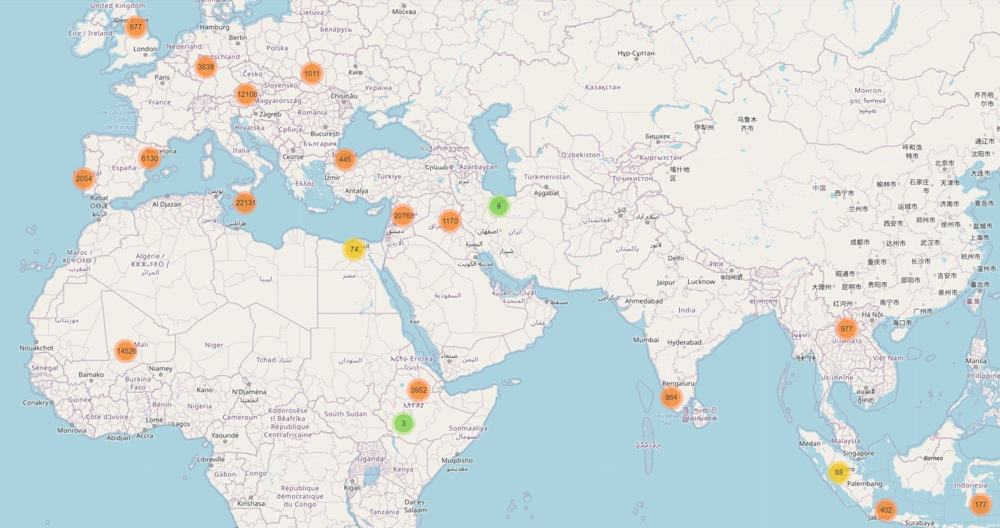

###5. EXPLORE AND HAVE FUN!!!

#####Query 1

In [53]:
#map_df['city_country'].value_counts()

In [54]:
#Find manuscripts in Aymanam, India


#map_df[map_df['city_country']=='Aymanam, India']

#####Query 2

In [55]:
#map_df['repository.name'].value_counts()

In [56]:
#Get Persian manuscripts in Turkey, Syria, and Iraq


#levant_persian = map_df[(map_df['country.name'] == 'Turkey') | (map_df['country.name'] == 'Syria') | (map_df['country.name'] == 'Iraq')]

In [57]:
#levant_persian